In [1]:
import numpy as np
import pandas as pd
import os
import time
import matplotlib.pyplot as plt
import cv2

In [2]:
sdir=r'/kaggle/input/chicken-disease-1/Train'
csvpath=r'/kaggle/input/chicken-disease-1/train_data.csv'
df=pd.read_csv(csvpath)


In [3]:
df.head()

,images,label
0,salmo.1558.jpg,Salmonella
1,cocci.1866.jpg,Coccidiosis
2,cocci.171.jpg,Coccidiosis
3,salmo.1484.jpg,Salmonella
4,ncd.100.jpg,New Castle Disease


In [4]:
df.columns=['filepaths', 'labels' ]
df.head()

,filepaths,labels
0,salmo.1558.jpg,Salmonella
1,cocci.1866.jpg,Coccidiosis
2,cocci.171.jpg,Coccidiosis
3,salmo.1484.jpg,Salmonella
4,ncd.100.jpg,New Castle Disease


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8067 entries, 0 to 8066
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   filepaths  8067 non-null   object
 1   labels     8067 non-null   object
dtypes: object(2)
memory usage: 126.2+ KB


In [6]:
df.describe(include="object")

,filepaths,labels
count,8067,8067
unique,8067,4
top,healthy.1145.jpg,Salmonella
freq,1,2625


In [7]:
df['filepaths']=df['filepaths'].apply(lambda x: os.path.join(sdir,x))
df.head()

,filepaths,labels
0,/kaggle/input/chicken-disease-1/Train/salmo.15...,Salmonella
1,/kaggle/input/chicken-disease-1/Train/cocci.18...,Coccidiosis
2,/kaggle/input/chicken-disease-1/Train/cocci.17...,Coccidiosis
3,/kaggle/input/chicken-disease-1/Train/salmo.14...,Salmonella
4,/kaggle/input/chicken-disease-1/Train/ncd.100.jpg,New Castle Disease


In [8]:
df.isna().sum()

filepaths    0
labels       0
dtype: int64

In [9]:
df.duplicated().sum()

0

In [10]:
img = df.iloc[10,0]
img

'/kaggle/input/chicken-disease-1/Train/cocci.686.jpg'

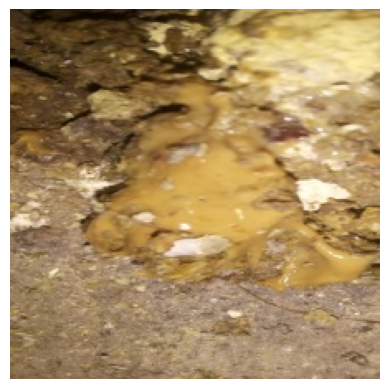

In [11]:
# Read the image with OpenCV
image = cv2.imread(img)

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.imshow(image_rgb)
plt.axis('off')  # Hide the axis for better visualization
plt.show()

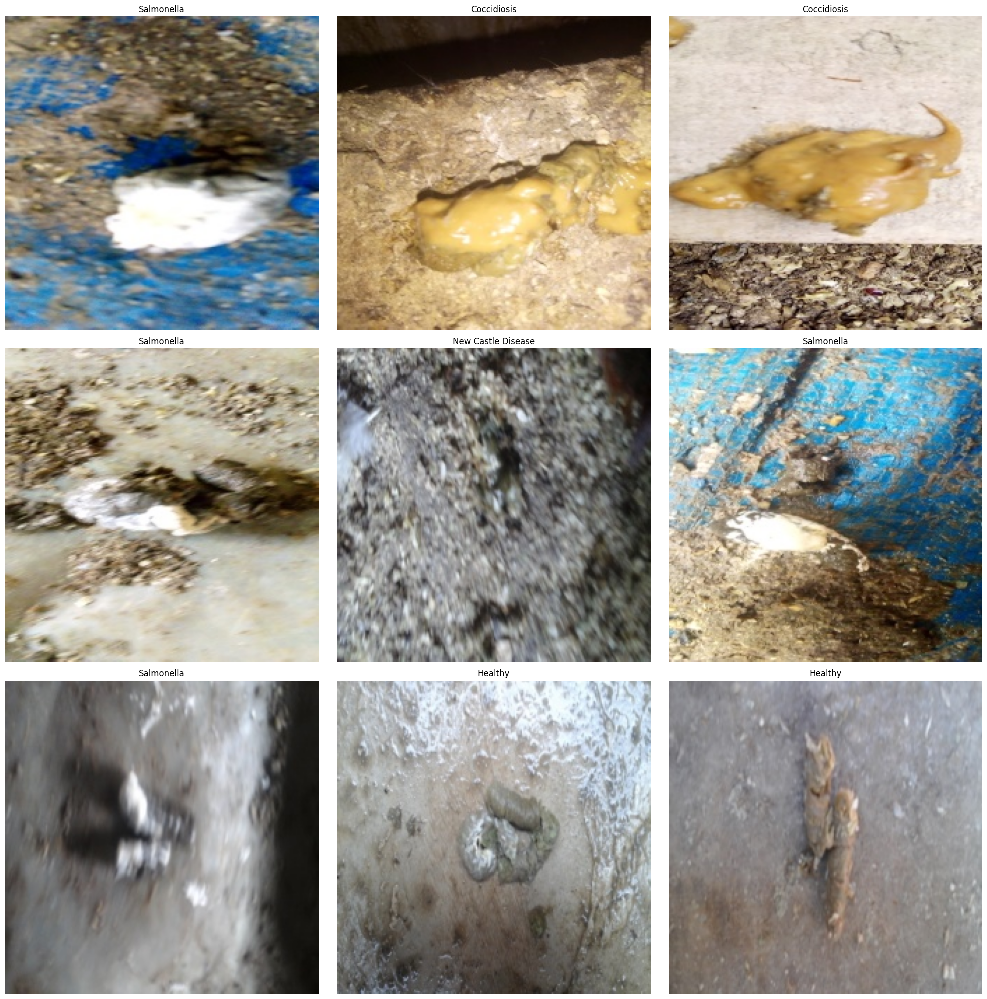

In [12]:
# Adjust the figure to have 3 rows and 3 columns
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(20, 20))
ax = ax.ravel()  # Flatten the axes array for easier indexing

# Loop through the images (up to 9)
for idx in range(min(9, len(df))):  # Get up to 9 images
    # Load the image from the file path
    img = cv2.imread(df['filepaths'][idx])
    
    if img is not None:
        img = cv2.resize(img, (224, 224))  # Resize if needed
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB format
        ax[idx].imshow(img_rgb)  # Display the image
        
        # Get the label
        label = df['labels'][idx]
        
        # Set title based on the label
        ax[idx].title.set_text(label)
        ax[idx].axis('off')  # Hide axes for a cleaner look
    else:
        print(f"Image at index {idx} not found or couldn't be loaded.")

plt.tight_layout()
plt.show()

In [13]:
image.shape

(224, 224, 3)

In [14]:
df['labels'].unique()

array(['Salmonella', 'Coccidiosis', 'New Castle Disease', 'Healthy'],
      dtype=object)

In [15]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

def transform_data(df, image_size=(180, 180)):
    images = []
    labels = []
    
    # Load and preprocess images
    for _, row in df.iterrows():
        img = cv2.imread(row['filepaths'])
        if img is not None:
            img = cv2.resize(img, image_size)  # Resize image
            img = img / 255.0  # Normalize image
            images.append(img)
            labels.append(row['labels'])
    
    # Convert to NumPy arrays
    X = np.array(images)
    
    # Encode labels
    lb = LabelEncoder()
    y = lb.fit_transform(labels)  # Integer encode labels
    y = to_categorical(y, num_classes=4)  # One-hot encode labels for 4 classes
    
    return X, y


def load_data(X, y):
    # This step can involve saving to disk, or directly using in model training
    return X, y



# Step 1: Transform
X, y = transform_data(df)

# Step 3: Load
X_train, y_train = load_data(X, y)

print(f"Data shape: {X_train.shape}, Labels shape: {y_train.shape}")


Data shape: (8067, 180, 180, 3), Labels shape: (8067, 4)


In [16]:
y

array([[0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.]])

In [17]:
from sklearn.model_selection import train_test_split


In [18]:
from sklearn.model_selection import train_test_split

# Initial 80-20 split for train and temp (test + validation)
train_df, temp_df, train_labels, temp_labels = train_test_split(
    X, y, train_size=0.8, shuffle=True, random_state=123, stratify=y
)

# Split the temporary set equally (50-50) into validation and test sets
val_df, test_df, val_labels, test_labels = train_test_split(
    temp_df, temp_labels, test_size=0.5, shuffle=True, random_state=123, stratify=temp_labels
)

# This results in:
# - train_df and train_labels: 80% of the data
# - val_df and val_labels: 10% of the data (validation set)
# - test_df and test_labels: 10% of the data (test set)

print("Train set:", train_df.shape, train_labels.shape)
print("Validation set:", val_df.shape, val_labels.shape)
print("Test set:", test_df.shape, test_labels.shape)


Train set: (6453, 180, 180, 3) (6453, 4)
Validation set: (807, 180, 180, 3) (807, 4)
Test set: (807, 180, 180, 3) (807, 4)


In [21]:
y

array([[0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.]])

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB5
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)



# Define the model using EfficientNetB5
base_model = EfficientNetB5(weights='imagenet', include_top=False, input_shape=(180, 180, 3))

# Freeze the layers in the base model
base_model.trainable = True  # Optionally keep this True for fine-tuning

# Create the model
model = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(4, activation='softmax')  # Adjust output layer for the number of classes
])

# Build the model with the input shape
model.build(input_shape=(None, 180, 180, 3))  # Include the channel dimension




# Adjust the model compilation
model.compile(optimizer=Adam(learning_rate=0.0001), 
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), 
              loss='categorical_crossentropy',  # Use sparse categorical if labels are not one-hot encoded
              metrics=['accuracy'])

# Print the model summary
model.summary()



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb5 (Functional)     │ (None, 6, 6, 2048)     │    28,513,527 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 73728)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │    18,874,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,430,587 (180.93 MB)

 Trainable params: 47,257,332 (180.27 MB)

 Non-trainable params: 173,255 (676.78 KB)

In [26]:
# Train the model without data generators
history = model.fit(
    train_df, train_labels,
    validation_data=(val_df, val_labels),
    epochs=30,  # Adjust the number of epochs as needed
    batch_size=32,
    verbose=1
)

Epoch 1/30


I0000 00:00:1730336755.964423      99 service.cc:145] XLA service 0x7d303c0020c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730336755.964478      99 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1730336915.785432      99 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_12', 116 bytes spill stores, 116 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_11', 16 bytes spill stores, 16 bytes spill loads

I0000 00:00:1730336915.960730      99 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


202/202 ━━━━━━━━━━━━━━━━━━━━ 479s 1s/step - accuracy: 0.7664 - loss: 0.5938 - val_accuracy: 0.2974 - val_loss: 2.3302
Epoch 2/30
202/202 ━━━━━━━━━━━━━━━━━━━━ 60s 299ms/step - accuracy: 0.9690 - loss: 0.1027 - val_accuracy: 0.2974 - val_loss: 2.2797
Epoch 3/30
202/202 ━━━━━━━━━━━━━━━━━━━━ 60s 298ms/step - accuracy: 0.9880 - loss: 0.0499 - val_accuracy: 0.3309 - val_loss: 3.0856
Epoch 4/30
202/202 ━━━━━━━━━━━━━━━━━━━━ 60s 298ms/step - accuracy: 0.9905 - loss: 0.0335 - val_accuracy: 0.8191 - val_loss: 0.6818
Epoch 5/30
202/202 ━━━━━━━━━━━━━━━━━━━━ 60s 298ms/step - accuracy: 0.9894 - loss: 0.0336 - val_accuracy: 0.9517 - val_loss: 0.2157
Epoch 6/30
202/202 ━━━━━━━━━━━━━━━━━━━━ 60s 297ms/step - accuracy: 0.9912 - loss: 0.0251 - val_accuracy: 0.9542 - val_loss: 0.1969
Epoch 7/30
202/202 ━━━━━━━━━━━━━━━━━━━━ 60s 299ms/step - accuracy: 0.9938 - loss: 0.0209 - val_accuracy: 0.9591 - val_loss: 0.1745
Epoch 8/30
202/202 ━━━━━━━━━━━━━━━━━━━━ 60s 299ms/step - accuracy: 0.9925 - loss: 0.0225 - val_a

26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.9779 - loss: 0.0974
Test Loss: 0.1215, Test Accuracy: 0.9740


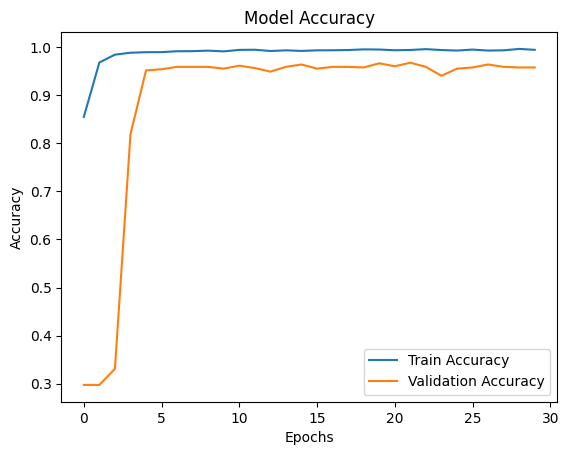

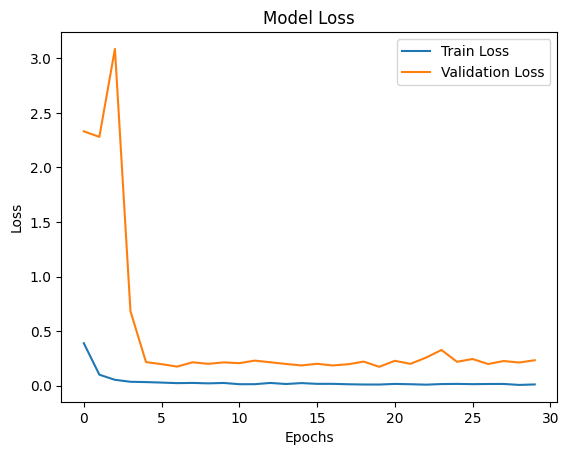

In [27]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_df, test_labels)
print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

# Visualize training history
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend()
plt.show()


In [28]:
test_loss, test_accuracy = model.evaluate(test_df, test_labels, verbose=1)

print("Test Accuracy:", test_accuracy)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.9779 - loss: 0.0974
Test Accuracy: 0.9739776849746704


26/26 ━━━━━━━━━━━━━━━━━━━━ 21s 450ms/step


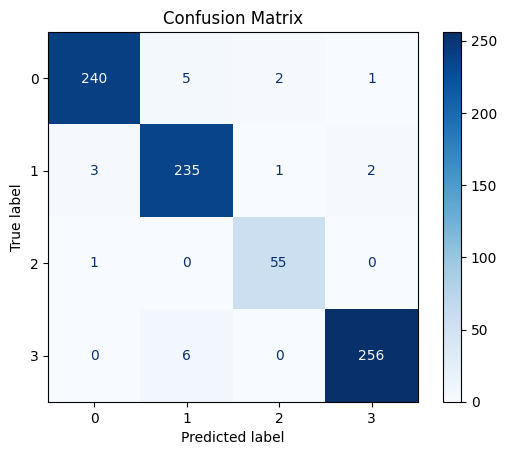

In [29]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np

# Make predictions on the test data
predictions = model.predict(test_df)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(test_labels, axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step
Test set: (807, 180, 180, 3) (807, 4)
Sample Predictions:
Image 1: True Label: [0. 1. 0. 0.], Predicted Label: 1
Image 2: True Label: [0. 0. 0. 1.], Predicted Label: 3
Image 3: True Label: [1. 0. 0. 0.], Predicted Label: 0
Image 4: True Label: [0. 1. 0. 0.], Predicted Label: 1
Image 5: True Label: [0. 0. 1. 0.], Predicted Label: 2
Image 6: True Label: [0. 0. 0. 1.], Predicted Label: 3
Image 7: True Label: [0. 1. 0. 0.], Predicted Label: 1
Image 8: True Label: [0. 0. 1. 0.], Predicted Label: 2
Image 9: True Label: [0. 0. 0. 1.], Predicted Label: 3


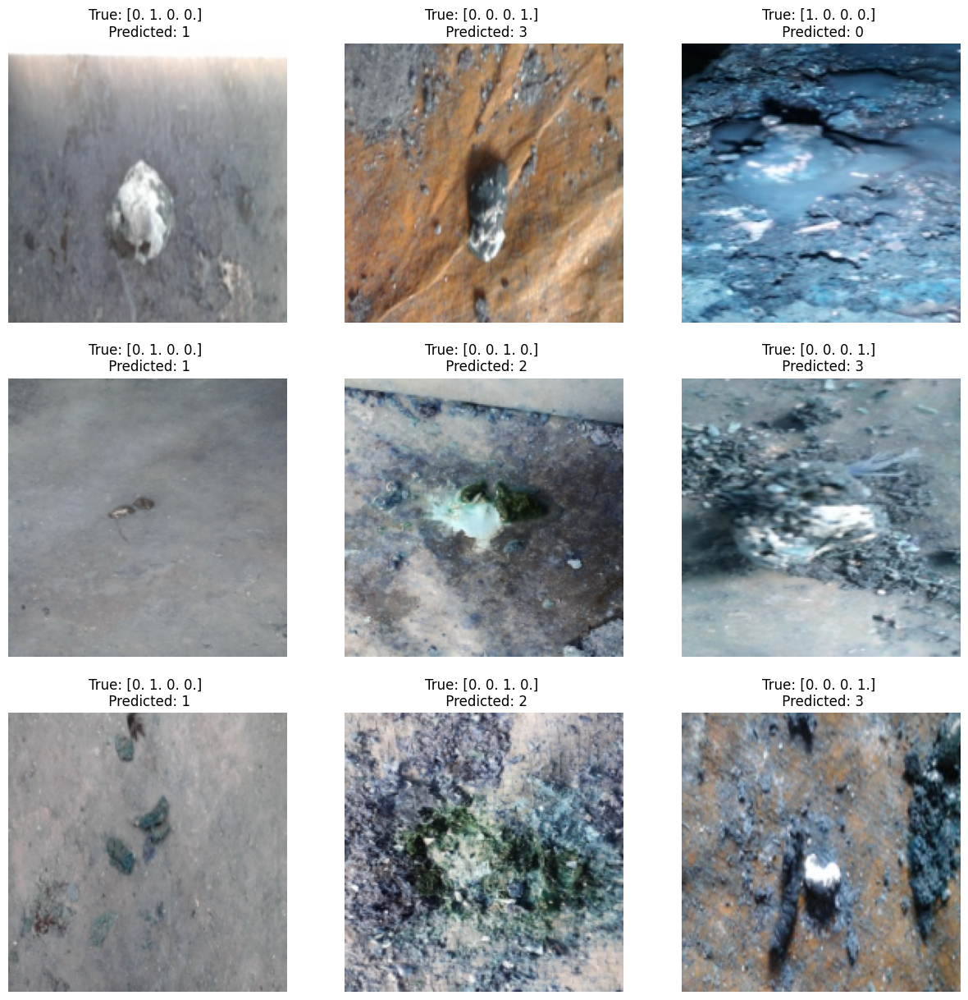

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have your test data and labels
# test_df: test images (as a NumPy array or a list of images)
# test_labels: corresponding labels for the test images

# Step 1: Make predictions
predictions = model.predict(test_df)

# Step 2: Convert predictions to class labels
predicted_classes = np.argmax(predictions, axis=1)

# Step 3: Print the shape of the test set
print("Test set:", test_df.shape, test_labels.shape)

# Step 4: Print predictions for 9 samples
num_samples_to_display = 9
print("Sample Predictions:")
for i in range(num_samples_to_display):
    print(f"Image {i+1}: True Label: {test_labels[i]}, Predicted Label: {predicted_classes[i]}")

# Optional: Visualize 9 images with their predictions
plt.figure(figsize=(15, 15))
for i in range(num_samples_to_display):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_df[i])  # Adjust according to your image format
    plt.title(f"True: {test_labels[i]} \n Predicted: {predicted_classes[i]}")
    plt.axis('off')

plt.show()


In [36]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np

# Assume df is your DataFrame with a column 'labels' containing the original labels

# Create a LabelEncoder instance
lb = LabelEncoder()

# Fit and transform the labels
encoded_labels = lb.fit_transform(df['labels'])  # This creates the mapping

# Print the original labels and their corresponding encodings
print("Label Encodings:")
for index, class_label in enumerate(lb.classes_):
    print(f"{index} -> {class_label}")

# Now you can see what 0, 1, 2, 3 refer to


Label Encodings:
0 -> Coccidiosis
1 -> Healthy
2 -> New Castle Disease
3 -> Salmonella


In [39]:
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Assume `X_test` and `y_test` are your test data and test labels, respectively

# Step 1: Make predictions on the test set
predictions = model.predict(test_df)

# Step 2: Convert predictions from one-hot encoding to label indices
# This gets the index with the highest probability for each prediction
encoded_predictions = np.argmax(predictions, axis=1)

# Step 3: Decode the predictions and true labels to get original label names
lb = LabelEncoder()
lb.classes_ = np.array(['Coccidiosis', 'Healthy', 'New Castle Disease', 'Salmonella'])  # Define your classes
decoded_predictions = lb.inverse_transform(encoded_predictions)
decoded_real_labels = lb.inverse_transform(np.argmax(test_labels, axis=1))

# Step 4: Display predictions with actual labels
for i in range(9):  # Display 9 examples
    print(f"Predicted: {decoded_predictions[i]}, Real: {decoded_real_labels[i]}")


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step
Predicted: Healthy, Real: Healthy
Predicted: Salmonella, Real: Salmonella
Predicted: Coccidiosis, Real: Coccidiosis
Predicted: Healthy, Real: Healthy
Predicted: New Castle Disease, Real: New Castle Disease
Predicted: Salmonella, Real: Salmonella
Predicted: Healthy, Real: Healthy
Predicted: New Castle Disease, Real: New Castle Disease
Predicted: Salmonella, Real: Salmonella


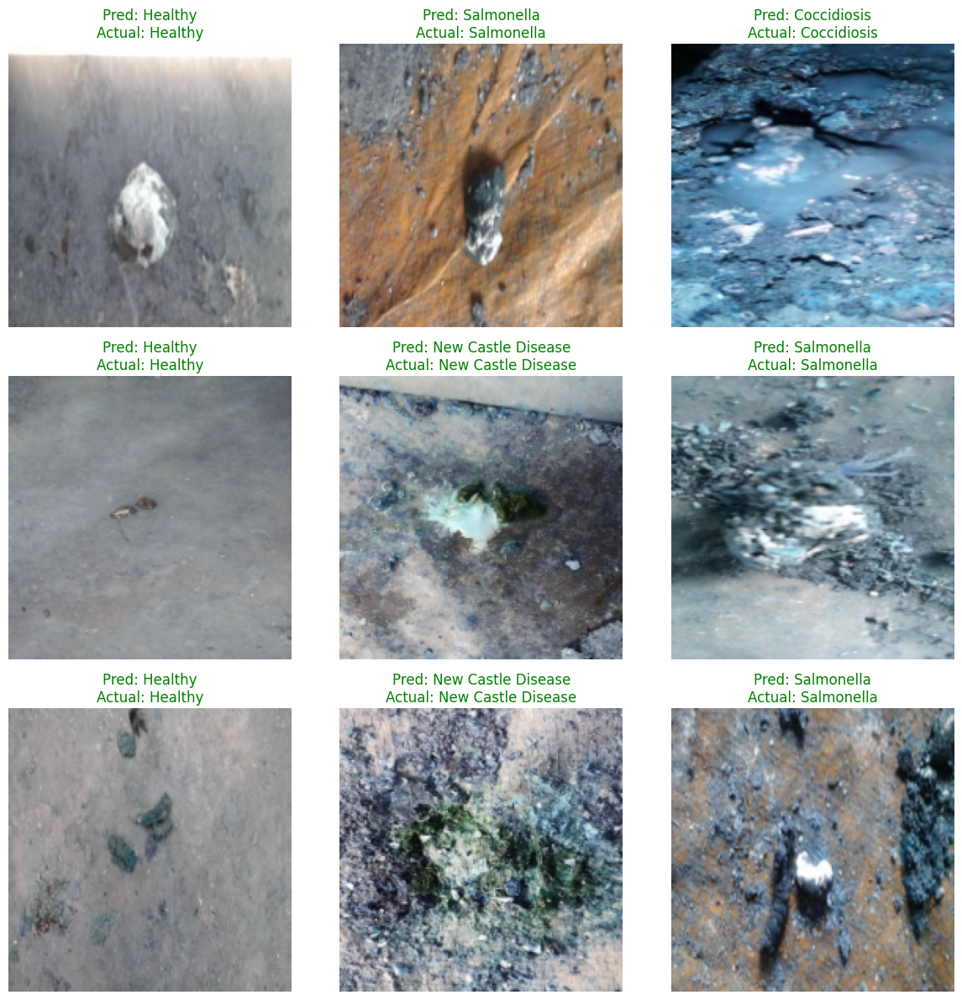

In [46]:
import matplotlib.pyplot as plt

# Plot settings
plt.figure(figsize=(12, 12))

# Display 9 sample predictions with images
for i in range(9):
    # Select image and labels for the i-th sample
    img = test_df[i]
    real_label = decoded_real_labels[i]
    predicted_label = decoded_predictions[i]

    # Plotting the image
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    
    # Display predicted and actual labels
    plt.title(f"Pred: {predicted_label}\nActual: {real_label}", color="green" if predicted_label == real_label else "red")

# Show the plot
plt.tight_layout()
plt.show()


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step
Predicted: Salmonella, Real: Salmonella
Predicted: Salmonella, Real: Salmonella
Predicted: Coccidiosis, Real: Coccidiosis
Predicted: Salmonella, Real: Salmonella
Predicted: Salmonella, Real: Salmonella
Predicted: Salmonella, Real: Salmonella
Predicted: Salmonella, Real: Salmonella
Predicted: New Castle Disease, Real: New Castle Disease
Predicted: Salmonella, Real: Salmonella


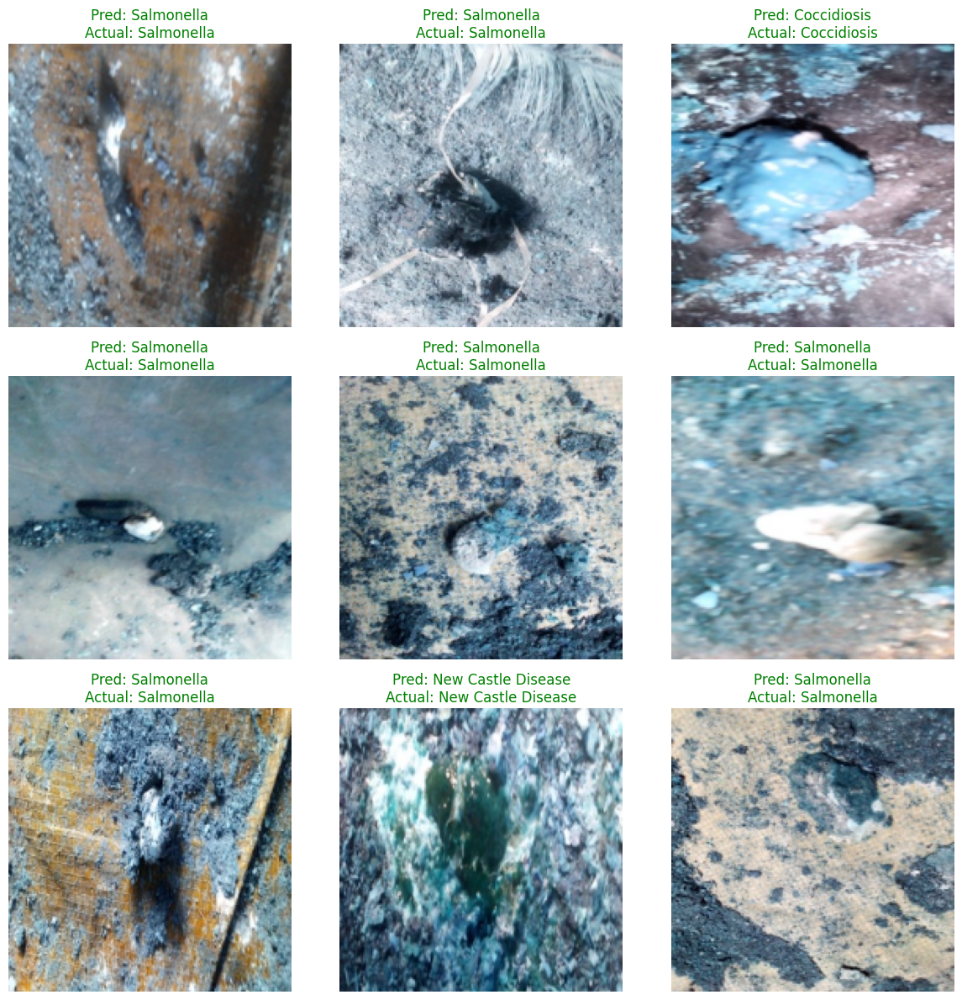

In [48]:
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Assume `X_test` and `y_test` are your test data and test labels, respectively

# Step 1: Make predictions on the test set
predictions = model.predict(test_df)

# Step 2: Convert predictions from one-hot encoding to label indices
# This gets the index with the highest probability for each prediction
encoded_predictions = np.argmax(predictions, axis=1)

# Step 3: Decode the predictions and true labels to get original label names
lb = LabelEncoder()
lb.classes_ = np.array(['Coccidiosis', 'Healthy', 'New Castle Disease', 'Salmonella'])  # Define your classes
decoded_predictions = lb.inverse_transform(encoded_predictions)
decoded_real_labels = lb.inverse_transform(np.argmax(test_labels, axis=1))

# Step 4: Display predictions with actual labels
for i in range(9,18):  # Display 9 examples
    print(f"Predicted: {decoded_predictions[i]}, Real: {decoded_real_labels[i]}")

    

# Plot settings
plt.figure(figsize=(12, 12))

# Display 9 sample predictions with images
for i in range(9,18):
    # Select image and labels for the i-th sample
    img = test_df[i]
    real_label = decoded_real_labels[i]
    predicted_label = decoded_predictions[i]

    # Plotting the image
    plt.subplot(3, 3, i-9 + 1)
    plt.imshow(img)
    plt.axis('off')
    
    # Display predicted and actual labels
    plt.title(f"Pred: {predicted_label}\nActual: {real_label}", color="green" if predicted_label == real_label else "red")

# Show the plot
plt.tight_layout()
plt.show()


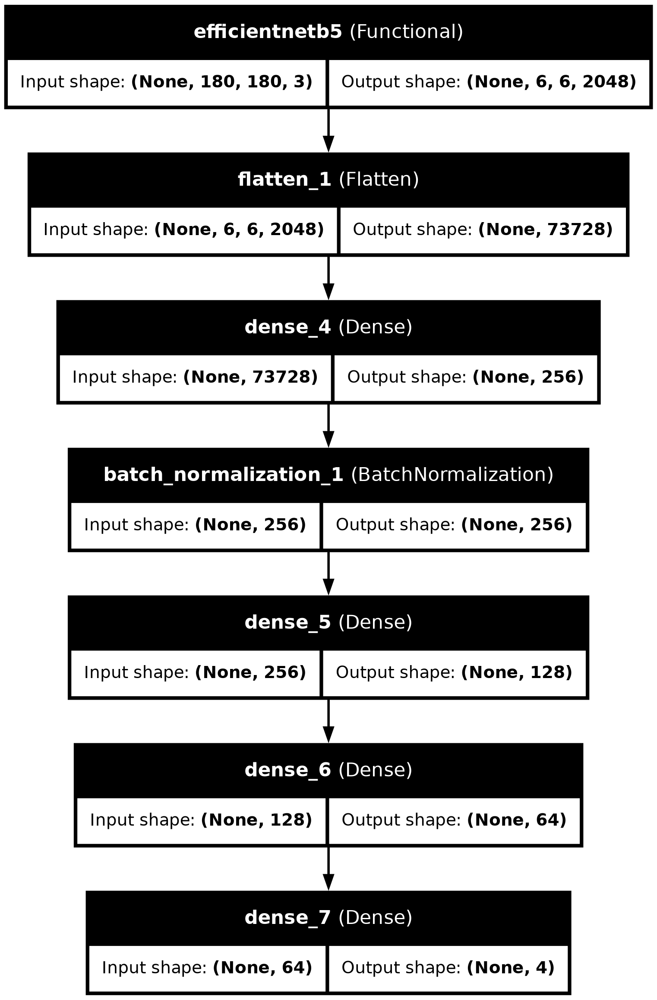

In [51]:
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
from IPython.display import Image, display

# Plot and save both model architectures
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


In [30]:
# Save the model after training
model.save('my_model.h5')

In [31]:
import pickle

# Save the model architecture and weights
with open('my_model.pkl', 'wb') as file:
    pickle.dump(model, file)
